In [ ]:
# Install Detectron2
import torch
import torchvision

# Check CUDA version
print(f"PyTorch version: {torch.__version__}")
print(f"CUDA available: {torch.cuda.is_available()}")
print(f"CUDA version: {torch.version.cuda}")

# Install Detectron2 (adjust CUDA version if needed)
!pip install 'git+https://github.com/facebookresearch/detectron2.git'

# Install other dependencies
!pip install opencv-python-headless
!pip install pycocotools

PyTorch version: 2.9.0+cu126
CUDA available: True
CUDA version: 12.6
  Cloning https://github.com/facebookresearch/detectron2.git to /tmp/pip-req-build-97xziztq
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/detectron2.git /tmp/pip-req-build-97xziztq
  Resolved https://github.com/facebookresearch/detectron2.git to commit fd27788985af0f4ca800bca563acdb700bb890e2
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 4.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.2/85.2 kB 7.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 16.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 7.6 MB/s eta 0:00:00
  Created wheel for detectron2: filename=detectron2-0.6-cp312-cp312-linux_x86_64.whl size=7085006 sha256=21d43705a7bf547f1ca74798bab3c50c2da74abb8fea5e2d283552ed017c823b
  Stored in directory: 

In [ ]:
import os
import cv2
import json
import numpy as np
import random
from pathlib import Path
import matplotlib.pyplot as plt
from tqdm import tqdm

import torch
import detectron2
from detectron2 import model_zoo
from detectron2.config import get_cfg
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.data.datasets import register_coco_instances
from detectron2.engine import DefaultTrainer, DefaultPredictor
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
from detectron2.utils.visualizer import Visualizer, ColorMode
from detectron2.structures import BoxMode

print("Detectron2 version:", detectron2.__version__)
print("CUDA available:", torch.cuda.is_available())

Detectron2 version: 0.6
CUDA available: True


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

# Set your dataset path
DATASET_PATH = "/content/UA-DETRAC-10K"  # Adjust this path

# Or upload dataset to Colab
# !unzip -q /content/your_dataset.zip -d /content/UA-DETRAC-10K

Mounted at /content/drive


In [ ]:
!cp -r /content/drive/MyDrive/UA-DETRAC-10K /content/UA-DETRAC-10K


In [ ]:
def yolo_to_coco(img_dir, label_dir, output_json, class_names):
    """
    Convert YOLO format to COCO format for Detectron2
    """
    images = []
    annotations = []
    categories = []

    # Add COCO 'info' field (REQUIRED for evaluation)
    info = {
        "year": 2024,
        "version": "1.0",
        "description": "UA-DETRAC Vehicle Detection Dataset",
        "contributor": "UA-DETRAC",
        "url": "",
        "date_created": "2024-11-20"
    }

    # Create categories
    for idx, class_name in enumerate(class_names):
        categories.append({
            "id": idx,
            "name": class_name,
            "supercategory": "vehicle"
        })

    img_files = sorted([f for f in os.listdir(img_dir) if f.endswith('.jpg')])

    annotation_id = 0

    for img_id, img_file in enumerate(tqdm(img_files, desc="Converting")):
        img_path = os.path.join(img_dir, img_file)
        label_path = os.path.join(label_dir, img_file.replace('.jpg', '.txt'))

        # Read image to get dimensions
        img = cv2.imread(img_path)
        if img is None:
            continue

        height, width = img.shape[:2]

        # Add image info
        images.append({
            "id": img_id,
            "file_name": img_file,
            "height": height,
            "width": width
        })

        # Read YOLO annotations
        if os.path.exists(label_path):
            with open(label_path, 'r') as f:
                for line in f.readlines():
                    parts = line.strip().split()
                    if len(parts) != 5:
                        continue

                    class_id, x_c, y_c, w, h = map(float, parts)

                    # Convert YOLO format to COCO format (x, y, width, height)
                    x1 = (x_c - w/2) * width
                    y1 = (y_c - h/2) * height
                    box_w = w * width
                    box_h = h * height

                    # Ensure valid box
                    x1 = max(0, x1)
                    y1 = max(0, y1)
                    box_w = min(box_w, width - x1)
                    box_h = min(box_h, height - y1)

                    if box_w > 0 and box_h > 0:
                        annotations.append({
                            "id": annotation_id,
                            "image_id": img_id,
                            "category_id": int(class_id),
                            "bbox": [x1, y1, box_w, box_h],
                            "area": box_w * box_h,
                            "iscrowd": 0
                        })
                        annotation_id += 1

    # Create COCO format dict with ALL required fields
    coco_format = {
        "info": info,  # ADDED: Required for COCO evaluation
        "licenses": [],  # ADDED: Required field
        "images": images,
        "annotations": annotations,
        "categories": categories
    }

    # Save to JSON
    with open(output_json, 'w') as f:
        json.dump(coco_format, f, indent=2)

    print(f"✓ Saved {len(images)} images and {len(annotations)} annotations to {output_json}")
    return coco_format


# Define class names
CLASS_NAMES = ["truck", "car", "van", "bus"]

# Convert train and validation sets
train_img_dir = os.path.join(DATASET_PATH, "train/images")
train_lbl_dir = os.path.join(DATASET_PATH, "train/labels")
val_img_dir = os.path.join(DATASET_PATH, "valid/images")
val_lbl_dir = os.path.join(DATASET_PATH, "valid/labels")

# Output paths
train_json = os.path.join(DATASET_PATH, "train_coco.json")
val_json = os.path.join(DATASET_PATH, "val_coco.json")

# Convert datasets
print("Converting training set...")
yolo_to_coco(train_img_dir, train_lbl_dir, train_json, CLASS_NAMES)

print("\nConverting validation set...")
yolo_to_coco(val_img_dir, val_lbl_dir, val_json, CLASS_NAMES)

print("\n✓ Conversion complete! JSON files now have proper COCO format.")

Converting training set...


Converting: 100%|██████████| 13736/13736 [00:29<00:00, 465.13it/s]


✓ Saved 13736 images and 126058 annotations to /content/UA-DETRAC-10K/train_coco.json

Converting validation set...


Converting: 100%|██████████| 2461/2461 [00:05<00:00, 451.69it/s]


✓ Saved 2461 images and 22419 annotations to /content/UA-DETRAC-10K/val_coco.json

✓ Conversion complete! JSON files now have proper COCO format.


In [ ]:
# Register datasets
register_coco_instances(
    "detrac_train",
    {},
    train_json,
    train_img_dir
)

register_coco_instances(
    "detrac_val",
    {},
    val_json,
    val_img_dir
)

# Set class names
MetadataCatalog.get("detrac_train").thing_classes = CLASS_NAMES
MetadataCatalog.get("detrac_val").thing_classes = CLASS_NAMES

print("✓ Datasets registered successfully!")
print(f"Classes: {CLASS_NAMES}")

✓ Datasets registered successfully!
Classes: ['truck', 'car', 'van', 'bus']


Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.



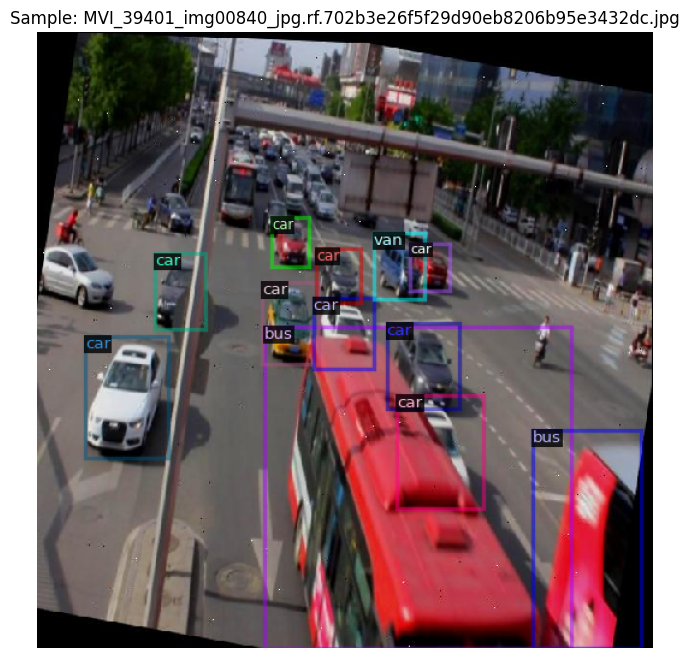

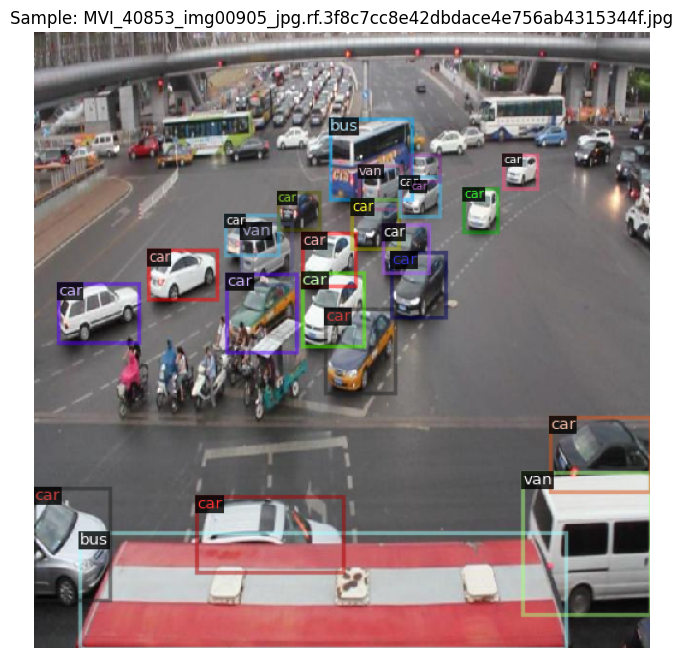

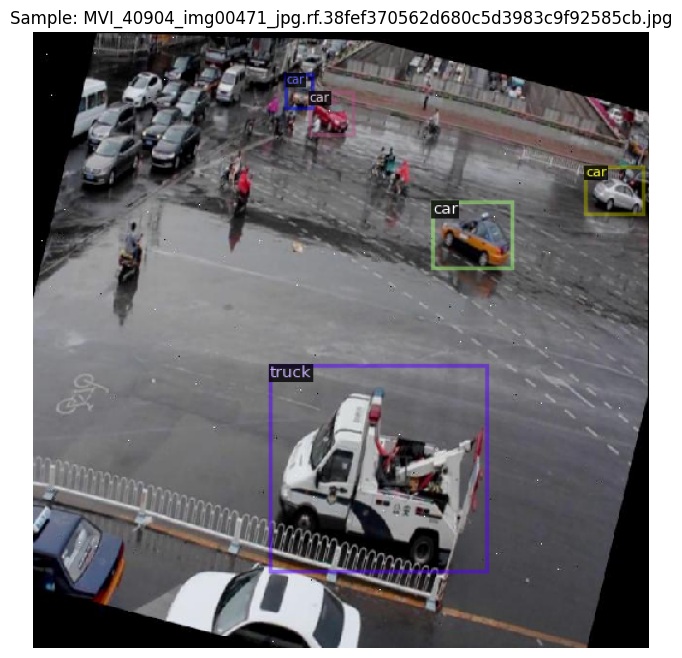

In [ ]:
# Visualize some training samples
dataset_dicts = DatasetCatalog.get("detrac_train")
metadata = MetadataCatalog.get("detrac_train")

# Show 3 random samples
for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=metadata, scale=0.8)
    vis = visualizer.draw_dataset_dict(d)

    plt.figure(figsize=(12, 8))
    plt.imshow(vis.get_image())
    plt.axis('off')
    plt.title(f"Sample: {os.path.basename(d['file_name'])}")
    plt.show()

In [ ]:
def setup_cfg():
    cfg = get_cfg()

    # Try alternative config path
    try:
        cfg.merge_from_file(model_zoo.get_config_file(
            "Cascades/cascade_rcnn_R_50_FPN_3x.yaml"
        ))
        cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url(
            "Cascades/cascade_rcnn_R_50_FPN_3x.yaml"
        )
        print("✓ Using Cascades/cascade_rcnn_R_50_FPN_3x.yaml")
    except:
        # Fallback: Use COCO Detection config
        cfg.merge_from_file(model_zoo.get_config_file(
            "COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"
        ))
        cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url(
            "COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"
        )
        # Manually enable Cascade
        cfg.MODEL.ROI_HEADS.NAME = "CascadeROIHeads"
        print("✓ Using COCO-Detection with manual Cascade setup")

    # Dataset
    cfg.DATASETS.TRAIN = ("detrac_train",)
    cfg.DATASETS.TEST = ("detrac_val",)
    cfg.DATALOADER.NUM_WORKERS = 2

    # Model configuration
    cfg.MODEL.ROI_HEADS.NUM_CLASSES = 4
    cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512
    cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5

    # CRITICAL: Class-agnostic regression
    cfg.MODEL.ROI_BOX_HEAD.CLS_AGNOSTIC_BBOX_REG = True

    # Disable masks
    cfg.MODEL.MASK_ON = False

    # Training hyperparameters
    cfg.SOLVER.IMS_PER_BATCH = 4
    cfg.SOLVER.BASE_LR = 0.002
    cfg.SOLVER.MAX_ITER = 15000
    cfg.SOLVER.STEPS = (10000, 13000)
    cfg.SOLVER.GAMMA = 0.1
    cfg.SOLVER.WARMUP_ITERS = 1000
    cfg.SOLVER.WARMUP_FACTOR = 1.0 / 1000
    cfg.SOLVER.CHECKPOINT_PERIOD = 1000

    # Data augmentation
    cfg.INPUT.MIN_SIZE_TRAIN = (480, 512, 544, 576, 608, 640, 672, 704, 736, 768, 800)
    cfg.INPUT.MAX_SIZE_TRAIN = 1333
    cfg.INPUT.MIN_SIZE_TEST = 800
    cfg.INPUT.MAX_SIZE_TEST = 1333

    # Output directory
    cfg.OUTPUT_DIR = "./output_cascade_rcnn"
    os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

    cfg.MODEL.DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

    return cfg

cfg = setup_cfg()
print(f"\n{'='*60}")
print("CONFIGURATION SUMMARY")
print(f"{'='*60}")
print(f"ROI Heads: {cfg.MODEL.ROI_HEADS.NAME if hasattr(cfg.MODEL.ROI_HEADS, 'NAME') else 'CascadeROIHeads'}")
print(f"Num Classes: {cfg.MODEL.ROI_HEADS.NUM_CLASSES}")
print(f"Class-agnostic regression: {cfg.MODEL.ROI_BOX_HEAD.CLS_AGNOSTIC_BBOX_REG}")
print(f"Mask training: {cfg.MODEL.MASK_ON}")
print(f"Max iterations: {cfg.SOLVER.MAX_ITER}")
print(f"Output: {cfg.OUTPUT_DIR}")
print(f"{'='*60}")

✓ Using COCO-Detection with manual Cascade setup

CONFIGURATION SUMMARY
ROI Heads: CascadeROIHeads
Num Classes: 4
Class-agnostic regression: True
Mask training: False
Max iterations: 15000
Output: ./output_cascade_rcnn


In [ ]:
class CustomTrainer(DefaultTrainer):
    @classmethod
    def build_evaluator(cls, cfg, dataset_name, output_folder=None):
        if output_folder is None:
            output_folder = os.path.join(cfg.OUTPUT_DIR, "inference")
        return COCOEvaluator(dataset_name, cfg, True, output_folder)

    def build_hooks(self):
        hooks = super().build_hooks()

        # Add validation and checkpointing hook
        from detectron2.evaluation import inference_on_dataset
        from detectron2.data import build_detection_test_loader
        from detectron2.engine.hooks import HookBase

        class ValidationAndCheckpoint(HookBase):
            def __init__(self, eval_period, checkpoint_period):
                self.eval_period = eval_period
                self.checkpoint_period = checkpoint_period
                self.best_metric = 0.0

            def after_step(self):
                next_iter = self.trainer.iter + 1

                # Save checkpoint periodically
                if next_iter % self.checkpoint_period == 0:
                    checkpoint_path = os.path.join(
                        cfg.OUTPUT_DIR,
                        f"model_checkpoint_{next_iter}.pth"
                    )
                    self.trainer.checkpointer.save(f"model_checkpoint_{next_iter}")
                    print(f"\n✓ Checkpoint saved at iteration {next_iter}")
                    print(f"   Location: {checkpoint_path}")

                    # Also save to Google Drive for safety
                    if os.path.exists("/content/drive/MyDrive"):
                        drive_path = f"/content/drive/MyDrive/cascade_checkpoint_{next_iter}.pth"
                        import shutil
                        shutil.copy2(checkpoint_path, drive_path)
                        print(f"   Backup saved to: {drive_path}")

                # Run validation periodically
                if next_iter % self.eval_period == 0:
                    print(f"\n{'='*60}")
                    print(f"VALIDATION at iteration {next_iter}")
                    print('='*60)

                    evaluator = COCOEvaluator(
                        "detrac_val",
                        cfg,
                        False,
                        output_dir=os.path.join(cfg.OUTPUT_DIR, f"eval_{next_iter}")
                    )
                    val_loader = build_detection_test_loader(cfg, "detrac_val")
                    results = inference_on_dataset(
                        self.trainer.model, val_loader, evaluator
                    )

                    # Get mAP
                    if "bbox" in results:
                        ap50 = results["bbox"]["AP50"]
                        print(f"\nAP50: {ap50:.2f}")

                        # Save best model
                        if ap50 > self.best_metric:
                            self.best_metric = ap50
                            best_model_path = os.path.join(cfg.OUTPUT_DIR, "model_best.pth")
                            self.trainer.checkpointer.save("model_best")
                            print(f"✓ New best model saved! AP50: {ap50:.2f}")

                            # Backup to Drive
                            if os.path.exists("/content/drive/MyDrive"):
                                drive_best = "/content/drive/MyDrive/cascade_best.pth"
                                import shutil
                                shutil.copy2(best_model_path, drive_best)
                                print(f"   Best model backed up to Drive")

                    print('='*60 + '\n')

        # Add the hook (evaluate every 500 iters, checkpoint every 1000 iters)
        hooks.insert(-1, ValidationAndCheckpoint(
            eval_period=500,
            checkpoint_period=1000  # Save checkpoint every 1000 iterations
        ))

        return hooks

print("✓ Custom trainer with checkpointing ready!")
print("  - Checkpoints saved every 1000 iterations")
print("  - Validation runs every 500 iterations")
print("  - Best model auto-saved to Google Drive")

✓ Custom trainer with checkpointing ready!
  - Checkpoints saved every 1000 iterations
  - Validation runs every 500 iterations
  - Best model auto-saved to Google Drive


In [ ]:
# Create trainer
trainer = CustomTrainer(cfg)
trainer.resume_or_load(resume=False)

# Start training
print("Starting training...")
print("="*60)
trainer.train()

print("\n✓ Training completed!")
print(f"Model saved to: {cfg.OUTPUT_DIR}")

[11/28 08:41:21 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_280758.pkl: 167MB [00:00, 199MB/s]                           
roi_heads.box_head.0.fc1.{bias, weight}
roi_heads.box_head.0.fc2.{bias, weight}
roi_heads.box_head.1.fc1.{bias, weight}
roi_heads.box_head.1.fc2.{bias, weight}
roi_heads.box_head.2.fc1.{bias, weight}
roi_heads.box_head.2.fc2.{bias, weight}
roi_heads.box_predictor.0.bbox_pred.{bias, weight}
roi_heads.box_predictor.0.cls_score.{bias, weight}
roi_heads.box_predictor.1.bbox_pred.{bias, weight}
roi_heads.box_predictor.1.cls_score.{bias, weight}
roi_heads.box_predictor.2.bbox_pred.{bias, weight}
roi_heads.box_predictor.2.cls_score.{bias, weight}
  roi_heads.box_head.fc1.{bias, weight}
  roi_heads.box_head.fc2.{bias, weight}
  roi_heads.box_predictor.cls_score.{bias, weight}
  roi_heads.box_predictor.bbox_pred.{bias, weight}


Starting training...
[11/28 08:41:24 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.12/dist-packages/torch/functional.py:505: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /pytorch/aten/src/ATen/native/TensorShape.cpp:4317.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
W1128 08:41:27.872000 1527 torch/fx/_symbolic_trace.py:52] is_fx_tracing will return true for both fx.symbolic_trace and torch.export. Please use is_fx_tracing_symbolic_tracing() for specifically fx.symbolic_trace or torch.compiler.is_compiling() for specifically torch.export/compile.


[11/28 08:41:41 d2.engine.hooks]: Overall training speed: 15 iterations in 0:00:11 (0.7833 s / it)
[11/28 08:41:41 d2.engine.hooks]: Total training time: 0:00:11 (0:00:00 on hooks)
[11/28 08:41:41 d2.utils.events]:  eta: 3:00:04  iter: 17  total_loss: 5.851  loss_cls_stage0: 1.537  loss_box_reg_stage0: 0.5251  loss_cls_stage1: 1.525  loss_box_reg_stage1: 0.4707  loss_cls_stage2: 1.681  loss_box_reg_stage2: 0.1739  loss_rpn_cls: 0.09481  loss_rpn_loc: 0.04307    time: 0.7324  last_time: 0.6041  data_time: 0.0447  last_data_time: 0.0255   lr: 3.3968e-05  max_mem: 3383M


KeyboardInterrupt: 

In [ ]:
import os
import shutil
import torch

# Check if we should resume from a checkpoint
resume_from_checkpoint = True

if resume_from_checkpoint:
    # Copy checkpoint from Drive
    drive_checkpoint = "/content/drive/MyDrive/cascade_checkpoint_11000.pth" #edit your checkpoint
    local_checkpoint = "./output_cascade_rcnn/model_checkpoint_11000.pth" #edit your checkpoint

    if os.path.exists(drive_checkpoint):
        os.makedirs("./output_cascade_rcnn", exist_ok=True)
        shutil.copy2(drive_checkpoint, local_checkpoint)
        print(f"✓ Copied checkpoint from Drive to local")

        # Load checkpoint and add full training state
        checkpoint = torch.load(local_checkpoint, map_location='cpu')

        # Check what's in the checkpoint
        print(f"Checkpoint keys: {list(checkpoint.keys())}")

        # Add all required fields for proper resuming
        if 'iteration' not in checkpoint:
            checkpoint['iteration'] = 11000  #edit your checkpoint
            print(f"✓ Added iteration: 11000") #edit your checkpoint

        # Save the modified checkpoint
        torch.save(checkpoint, local_checkpoint)
        print(f"✓ Saved modified checkpoint")

    # Set config to load this checkpoint
    cfg.MODEL.WEIGHTS = local_checkpoint

    # Create trainer
    trainer = CustomTrainer(cfg)

    # Load checkpoint manually without path manipulation
    print(f"Loading checkpoint from: {local_checkpoint}")
    checkpoint_data = torch.load(local_checkpoint)

    # Load model weights
    trainer.model.load_state_dict(checkpoint_data['model'])
    print(f"✓ Loaded model weights")

    # Load optimizer if exists
    if 'optimizer' in checkpoint_data:
        trainer.optimizer.load_state_dict(checkpoint_data['optimizer'])
        print(f"✓ Loaded optimizer state")

    # Load scheduler if exists
    if 'scheduler' in checkpoint_data:
        trainer.scheduler.load_state_dict(checkpoint_data['scheduler'])
        print(f"✓ Loaded scheduler state")

    # Set iteration
    if 'iteration' in checkpoint_data:
        trainer.start_iter = checkpoint_data['iteration']
        trainer.iter = checkpoint_data['iteration']
        print(f"✓ Set iteration to: {trainer.iter}")
    else:
        # Manually set if not in checkpoint
        trainer.start_iter = 11000
        trainer.iter = 11000
        print(f"✓ Manually set iteration to: 11000") #edit your checkpoint

else:
    # Start fresh training
    print("Starting training from scratch...")
    trainer = CustomTrainer(cfg)
    trainer.resume_or_load(resume=False)

# Start/continue training
print("\n" + "="*60)
print("TRAINING - CASCADE R-CNN")
print("="*60)
print(f"Start iteration: {trainer.start_iter}")
print(f"Current iteration: {trainer.iter}")
print(f"Output directory: {cfg.OUTPUT_DIR}")
print(f"Max iterations: {cfg.SOLVER.MAX_ITER}")
print(f"Remaining iterations: {cfg.SOLVER.MAX_ITER - trainer.start_iter}")
print(f"Progress: {(trainer.start_iter / cfg.SOLVER.MAX_ITER) * 100:.1f}%")
print(f"Checkpoints every: 1000 iterations")
print(f"Validation every: 500 iterations")
print("="*60 + "\n")

try:
    trainer.train()
    print("\n✓ Training completed successfully!")
except KeyboardInterrupt:
    print("\n⚠️ Training interrupted by user")
    print(f"  Latest checkpoint saved in: {cfg.OUTPUT_DIR}")
except Exception as e:
    print(f"\n❌ Training stopped due to error: {e}")
    import traceback
    traceback.print_exc()
finally:
    print(f"\nModel checkpoints available at: {cfg.OUTPUT_DIR}")
    print(f"Google Drive backup: /content/drive/MyDrive/")

✓ Copied checkpoint from Drive to local
Checkpoint keys: ['model', 'trainer']
✓ Added iteration: 11000
✓ Saved modified checkpoint
[11/28 08:42:07 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), str

In [ ]:
from detectron2.engine import DefaultPredictor
from detectron2.utils.visualizer import Visualizer, ColorMode
import cv2
import matplotlib.pyplot as plt

# Copy the final checkpoint from Drive (if not already in local)
# Option 2: Use the best checkpoint
drive_checkpoint = "/content/drive/MyDrive/cascade_best.pth"
local_checkpoint = "./cascade_best.pth"

if not os.path.exists(local_checkpoint):
    import shutil
    shutil.copy2(drive_checkpoint, local_checkpoint)
    print("✓ Copied best checkpoint from Drive")

cfg.MODEL.WEIGHTS = local_checkpoint
predictor = DefaultPredictor(cfg)
print(f"✓ Model loaded from: {cfg.MODEL.WEIGHTS}")

✓ Model loaded from: ./cascade_best.pth


Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.



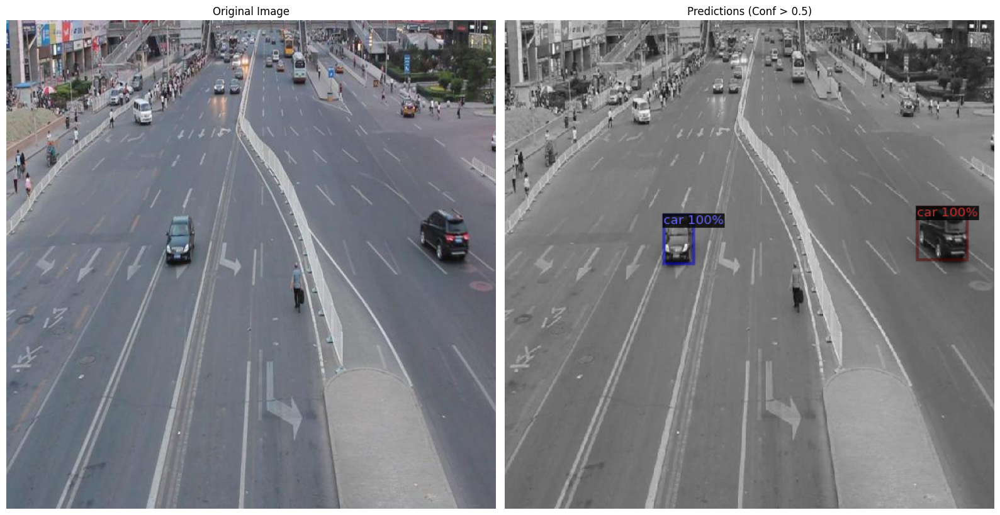


Image: MVI_40712_img00049_jpg.rf.2aca193ad0a9ca7589282352373f3b6d.jpg
Detections: 2
  1. car - Confidence: 0.999
  2. car - Confidence: 0.998
------------------------------------------------------------


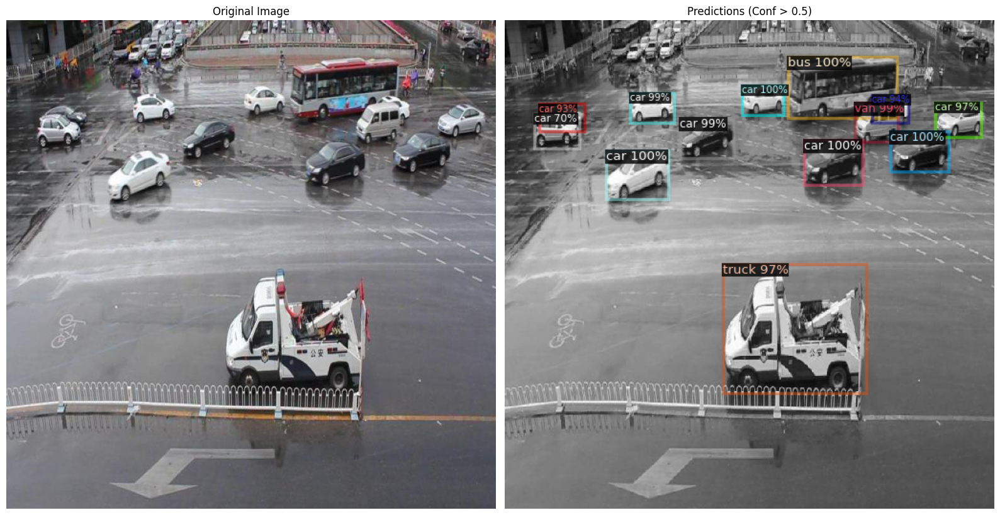


Image: MVI_40903_img00154_jpg.rf.c0535433eb220a8c2f9fe37d4d2e5a4a.jpg
Detections: 13
  1. car - Confidence: 0.999
  2. car - Confidence: 0.998
  3. car - Confidence: 0.998
  4. car - Confidence: 0.996
  5. bus - Confidence: 0.996
  6. van - Confidence: 0.994
  7. car - Confidence: 0.994
  8. car - Confidence: 0.987
  9. car - Confidence: 0.972
  10. truck - Confidence: 0.969
  11. car - Confidence: 0.937
  12. car - Confidence: 0.929
  13. car - Confidence: 0.703
------------------------------------------------------------


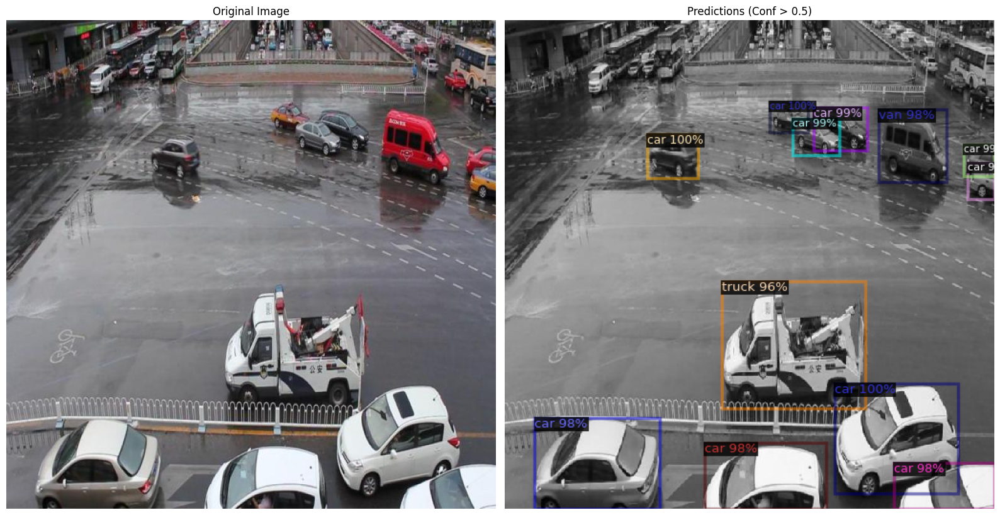


Image: MVI_40905_img00807_jpg.rf.df40371b3a55b89a091a65d2d3d79b5e.jpg
Detections: 12
  1. car - Confidence: 0.999
  2. car - Confidence: 0.997
  3. car - Confidence: 0.996
  4. car - Confidence: 0.994
  5. car - Confidence: 0.991
  6. car - Confidence: 0.989
  7. car - Confidence: 0.987
  8. car - Confidence: 0.985
  9. car - Confidence: 0.984
  10. van - Confidence: 0.984
  11. car - Confidence: 0.981
  12. truck - Confidence: 0.963
------------------------------------------------------------


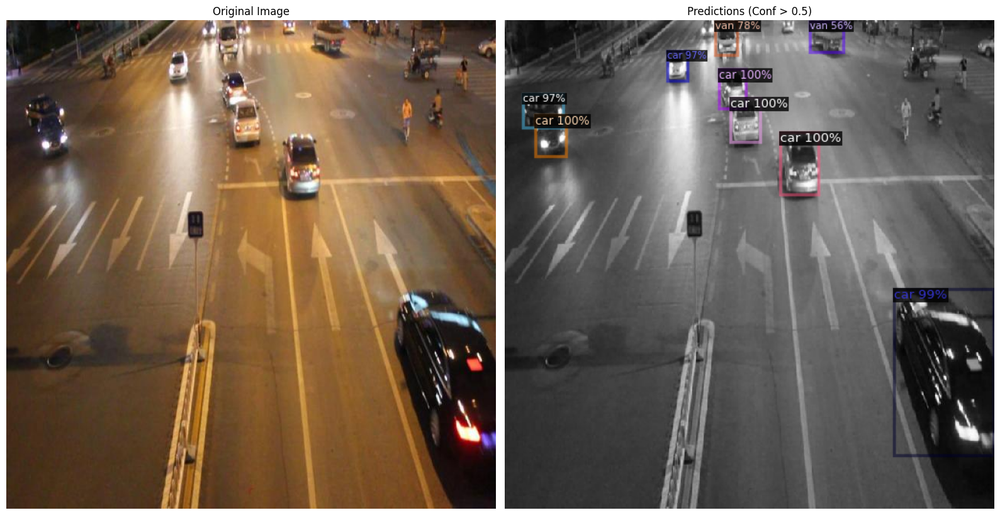


Image: MVI_40771_img00993_jpg.rf.98544275bb007cfdf2eb999c41d36e37.jpg
Detections: 9
  1. car - Confidence: 0.998
  2. car - Confidence: 0.998
  3. car - Confidence: 0.998
  4. car - Confidence: 0.996
  5. car - Confidence: 0.986
  6. car - Confidence: 0.968
  7. car - Confidence: 0.966
  8. van - Confidence: 0.778
  9. van - Confidence: 0.562
------------------------------------------------------------


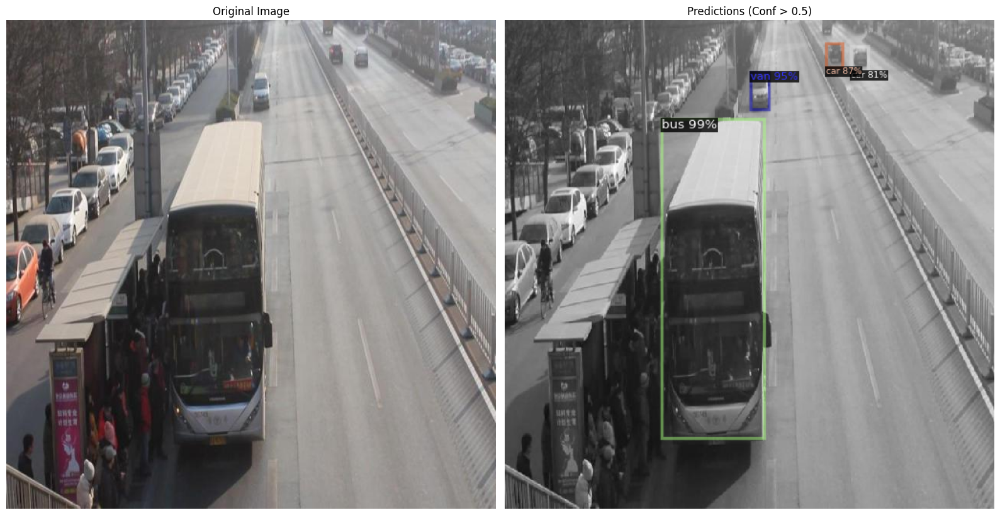


Image: MVI_20062_img00633_jpg.rf.2d3bc48ac720884d1ba2bc505c9af39e.jpg
Detections: 4
  1. bus - Confidence: 0.991
  2. van - Confidence: 0.951
  3. car - Confidence: 0.872
  4. car - Confidence: 0.809
------------------------------------------------------------


In [ ]:
# Get validation dataset
dataset_dicts = DatasetCatalog.get("detrac_val")
metadata = MetadataCatalog.get("detrac_val")

# Test on random samples
num_samples = 5
for d in random.sample(dataset_dicts, num_samples):
    img_path = d["file_name"]
    img = cv2.imread(img_path)

    # Run prediction
    outputs = predictor(img)

    # Visualize
    v = Visualizer(img[:, :, ::-1],
                   metadata=metadata,
                   scale=0.8,
                   instance_mode=ColorMode.IMAGE_BW)

    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))

    # Display
    plt.figure(figsize=(16, 10))
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title("Original Image")
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(out.get_image())
    plt.title(f"Predictions (Conf > {cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST})")
    plt.axis('off')

    plt.tight_layout()
    plt.show()

    # Print detection details
    instances = outputs["instances"].to("cpu")
    print(f"\nImage: {os.path.basename(img_path)}")
    print(f"Detections: {len(instances)}")
    for i, (box, cls, score) in enumerate(zip(instances.pred_boxes,
                                                instances.pred_classes,
                                                instances.scores)):
        print(f"  {i+1}. {CLASS_NAMES[cls]} - Confidence: {score:.3f}")
    print("-" * 60)

✓ Image loaded successfully: (750, 1000, 3)


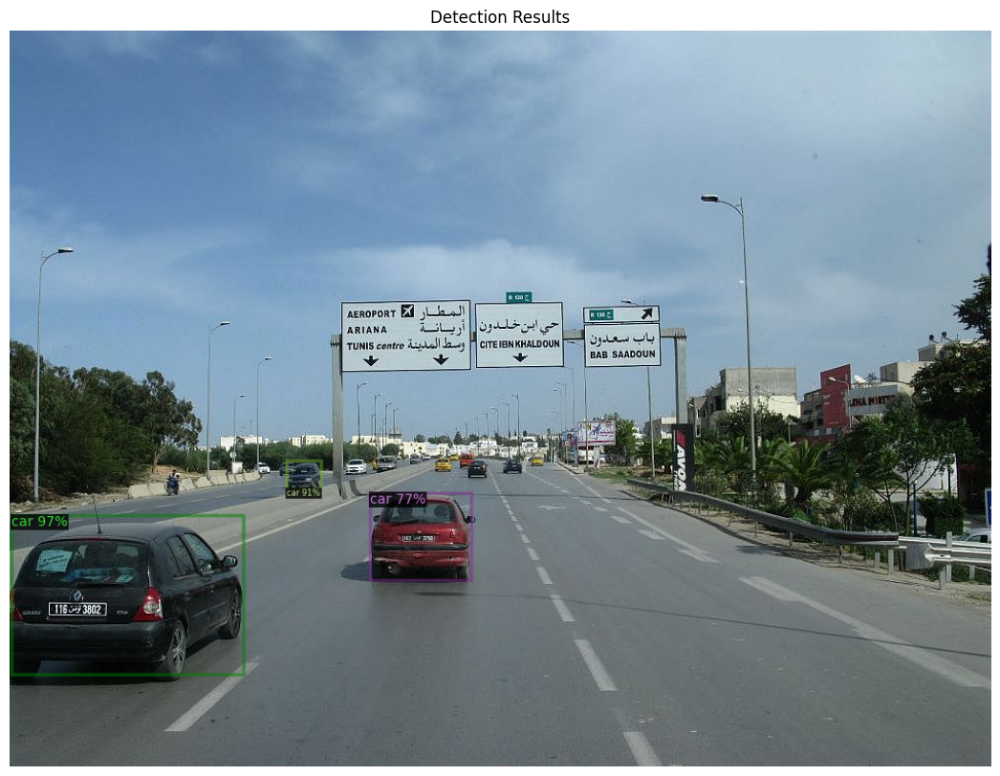


Total Detections: 3
1. car - Confidence: 0.968
2. car - Confidence: 0.908
3. car - Confidence: 0.765


In [ ]:
# Fix the image path
test_image_path = "/content/drive/MyDrive/2.jpg"  # Removed duplicate .jpg

# Check if image exists and load it
if not os.path.exists(test_image_path):
    print(f"❌ Image not found at: {test_image_path}")
    print("\nAvailable images in MyDrive:")
    !ls /content/drive/MyDrive/*.jpg 2>/dev/null || echo "No .jpg files found"
else:
    img = cv2.imread(test_image_path)

    if img is None:
        print(f"❌ Failed to load image: {test_image_path}")
    else:
        print(f"✓ Image loaded successfully: {img.shape}")

        # Run prediction
        outputs = predictor(img)

        # Visualize
        v = Visualizer(img[:, :, ::-1], metadata=metadata, scale=1.0)
        out = v.draw_instance_predictions(outputs["instances"].to("cpu"))

        plt.figure(figsize=(16, 10))
        plt.imshow(out.get_image())
        plt.axis('off')
        plt.title("Detection Results")
        plt.show()

        # Print detection details
        instances = outputs["instances"].to("cpu")
        print(f"\n{'='*60}")
        print(f"Total Detections: {len(instances)}")
        print(f"{'='*60}")
        for i, (box, cls, score) in enumerate(zip(instances.pred_boxes,
                                                    instances.pred_classes,
                                                    instances.scores)):
            print(f"{i+1}. {CLASS_NAMES[cls]} - Confidence: {score:.3f}")